In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader 
from torch.autograd import Variable
from torch.backends import cudnn


import matplotlib.pyplot as plt
import os
from PIL import Image
import cv2
import numpy as np


# Augmenting library 

import torchvision
import torchvision.transforms.functional as TF
import albumentations as A
import torchvision.transforms as T

# Control Randomness
import random
random_seed = 7
torch.manual_seed(random_seed)
torch.backends.cudnn.deterministic = False
torch.backends.cudnn.benchmark = True
np.random.seed(random_seed)
random.seed(random_seed)

import warnings
warnings.filterwarnings("ignore")
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "2"
print(torch.cuda.device_count())


# logging
import datetime
from tensorboardX import SummaryWriter
from tqdm import tqdm
import time 

/home/sklab2/anaconda3/envs/vessel2/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


1


In [2]:
import joint_transforms
from config import cod_training_root
from config import backbone_path
from datasets import ImageFolder
from misc import AvgMeter, check_mkdir
from PFNet import PFNet
from helper import FocalLoss, CosineAnnealingWarmupRestarts
import loss

# Config

In [3]:
ckpt_path = './ckpt'
exp_name = 'PFNet'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
args = {
    'epoch_num': 300,
    'train_batch_size': 32,
    'last_epoch': 0,
    'lr': 1e-4, 
    'lr_decay': 0.9,
    'weight_decay': 5e-4,
    'momentum': 0.9,
    'snapshot': '',
    'scale': 416, 
    'save_point': [],
    'poly_train': False,
    'optimizer': 'Adam',
    'amp' : False
}

In [4]:
# loss function
structure_loss = loss.structure_loss().to(device)
bce_loss = nn.BCEWithLogitsLoss().to(device)
iou_loss = loss.IOU().to(device)
# focal_loss = FocalLoss(weight=torch.tensor([0.25, 0.75]).to(device), gamma=2, reduction='mean')

In [5]:
from helper import sigmoid_focal_loss


def bce_iou_loss(pred, target):
    bce_out = bce_loss(pred, target)
    iou_out = iou_loss(pred, target)
    loss = bce_out + iou_out
    return loss

def focal_iou_loss(pred, target):
    focal = sigmoid_focal_loss(pred, target, alpha=0.25, gamma=2, reduction='mean')
    iou_out = iou_loss(pred, target)
    loss = focal + iou_out
    return loss

# Net

In [6]:
net = PFNet(backbone_path)

From ./backbone/resnet/resnet50-19c8e357.pth Load resnet50 Weights Succeed!


In [7]:
from torch.optim.lr_scheduler import ReduceLROnPlateau



if args['optimizer'] == 'SGD':
    print('SGD opt')
    optimizer = torch.optim.SGD([
        {'params': [param for name, param in net.named_parameters() if name[-4:] == 'bias'],
        'lr': 2 * args['lr']},
        {'params': [param for name, param in net.named_parameters() if name[-4:] != 'bias'],
        'lr': 1 * args['lr'], 'weight_decay': args['weight_decay']}
    ], momentum=args['momentum'])

else:
    print('Adam opt')
    optimizer = torch.optim.Adam([
        {'params': [param for name, param in net.named_parameters() if name[-4:] == 'bias'],
            'lr': 2 * args['lr']},
        {'params': [param for name, param in net.named_parameters() if name[-4:] != 'bias'],
            'lr': 1 * args['lr'], 'weight_decay': args['weight_decay']}
    ])

# scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=20, \
#                                 threshold=0.05, threshold_mode='rel', cooldown=5, min_lr = 1e-4)

scheduler = CosineAnnealingWarmupRestarts(optimizer, first_cycle_steps=50, cycle_mult=1.0, max_lr=1e-3, min_lr=1e-5, warmup_steps=5, gamma=0.8)

Adam opt


## making data index list

In [8]:
mask_files = os.walk("/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/masked")
mask_idx = []
for (root, dirs, files) in mask_files:
    if len(files) > 0 :
        mask_idx.append(files)

mask_idxs = [element for array in mask_idx for element in array]
len(mask_idxs)

1691

In [9]:
# 1~ 11 / 12, 13, 14  , 40, 41, 43, 44, 46, 49,  50, 53, 54, 55 
train_indexs = []
test_indexs = []
for idx, data in enumerate(mask_idxs):
    tmp = mask_idxs[idx].split('_')
    if len(tmp) < 3:
        if int(tmp[0]) < 45:
            train_indexs.append([ tmp[0], tmp[1].split('.')[0]])
        else:
            test_indexs.append([tmp[0], tmp[1].split('.')[0]])

In [10]:
len(train_indexs) , len(test_indexs)

(1319, 355)

In [11]:
import albumentations.augmentations.functional as AF

PATH = '/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/'
class VesselDataset(Dataset):
    def __init__(self, index, transforms):
        self.index = index
        self.transforms = transforms
        
    def __len__(self):
        return len(self.index)
        
    def __getitem__(self, idx):
        s_1 = self.index[idx][0]
        s_2 = self.index[idx][1]

        # '1_L_0.jpg', 
        # image = Image.open(PATH+'origin/' + s_1+'_L_'+s_2+'.jpg').convert("L").resize((416, 416),Image.Resampling.BILINEAR)
        image = Image.open(PATH+'origin/' + s_1+'_L_'+s_2+'.jpg').resize((416, 416),Image.Resampling.BILINEAR)
        #'10_L_112_L.png', 
        mask = Image.open(PATH+'masked/' +  s_1+'_'+s_2+'.png').resize((416, 416),Image.Resampling.BILINEAR)
        
        image = np.array(image, dtype=np.uint8) #RGB
        mask = np.array(mask, dtype=np.uint8)   # HWC
        # mask_o = mask / 255        # CHW
        mask_o = mask.transpose(2, 0, 1)
        lower_red = np.array([-10, 100, 100]) 
        upper_red = np.array([10, 255, 255])

        lower_yellow = np.array([22, 93, 0]) 
        upper_yellow = np.array([45, 255, 255]) 

        mask_hsv = cv2.cvtColor(mask, cv2.COLOR_RGB2HSV)

        mask_r = cv2.inRange(mask_hsv, lower_red, upper_red)
        mask_y = cv2.inRange(mask_hsv, lower_yellow, upper_yellow)
        mask_y = 255 - mask_y # 색반전
        mask_r, mask_y = mask_r/255, mask_y/255

        mask_r = np.clip(mask_r, 0 ,1)
        mask_y = np.clip(mask_y, 0, 1)

        mask_r = np.expand_dims(mask_r,axis=0)
        mask_y = np.expand_dims(mask_y,axis=0)
        mask = np.concatenate([mask_r, mask_y], axis=0)
        
        # aft_mask = cv2.resize(aft_mask, (416, 416), interpolation=cv2.INTER_NEAREST)
        masks = [mask_r, mask_y]
        # for num in range(3): #### 3번 이터레이션이 왜들어갔지?
        if self.transforms:
            transformed = self.transforms(image=image, masks=masks)
            image, masks = transformed['image'], transformed['masks']
        # urls.append(s_1+'_'+s_2)
        # assert sum(masks[0]==0).sum() + sum(masks[0]==1).sum() == 416*416   # mask가 0 또는 1이 아닐경우 스탑
                    
        return image, masks, mask_o

# Transforms

In [12]:
import albumentations.pytorch as AP


train_transforms = A.Compose([
    # A.RandomRotate90(p=0.25),
    A.HorizontalFlip(p=0.25),
    A.VerticalFlip(p=0.25),
    A.OneOf([
        A.OpticalDistortion(p=1, distort_limit=0.1, interpolation=cv2.INTER_NEAREST),
        A.GridDistortion(p=1, interpolation=cv2.INTER_NEAREST),
        A.ElasticTransform(p=1, interpolation=cv2.INTER_NEAREST),
        ], p = 0.5),  # 밝기 및 조도 변화
    # A.Normalize(mean=(126.71482973095203, 126.6879562017254, 126.85466873988524), std = (32.9434, 33.0122, 32.9186)),
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.25),
    AP.ToTensorV2(transpose_mask=False),
])

test_transforms = A.Compose([
    AP.ToTensorV2(transpose_mask=False)
])

train_dataset = VesselDataset(index=train_indexs, transforms=train_transforms)
test_dataset = VesselDataset(index=test_indexs, transforms=test_transforms)
 
#train_dataset, _, test_dataset = torch.utils.data.random_split(dataset, [train, 0, test])

train_loader = DataLoader(dataset=train_dataset, batch_size=args['train_batch_size'], shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

# image, [mask_r, mask_y, mask_o] =next(iter(train_loader))
image, [mask_r, mask_y], mask_o = next(iter(train_loader))
print(image.shape, mask_r.shape, mask_y.shape, mask_o.shape)

torch.Size([32, 3, 416, 416]) torch.Size([32, 1, 416, 416]) torch.Size([32, 1, 416, 416]) torch.Size([32, 3, 416, 416])


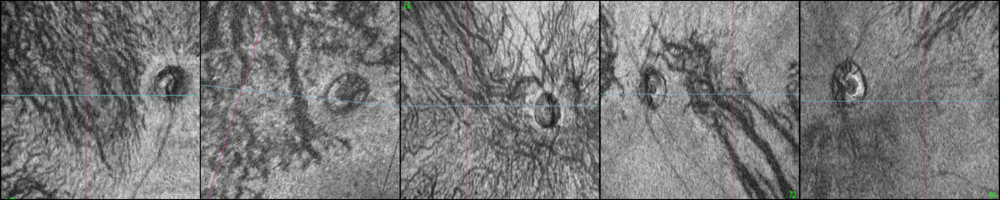

In [13]:
TF.to_pil_image(torchvision.utils.make_grid(image[:5]))

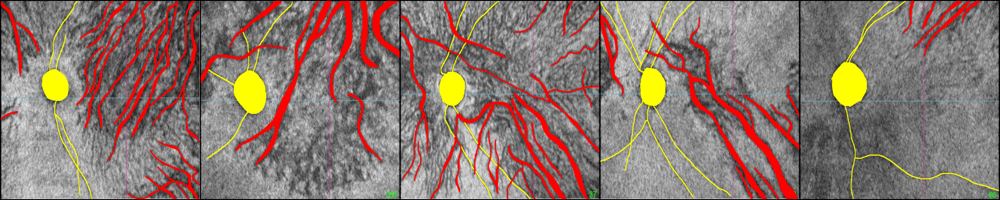

In [14]:
TF.to_pil_image(torchvision.utils.make_grid(mask_o[:5]))

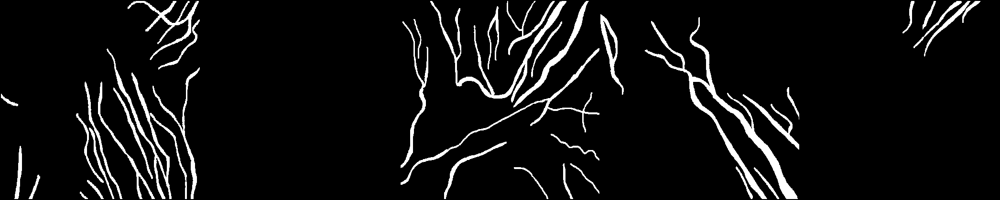

In [15]:
TF.to_pil_image(torchvision.utils.make_grid(mask_r[:5].expand(5, 3, 416, 416)))

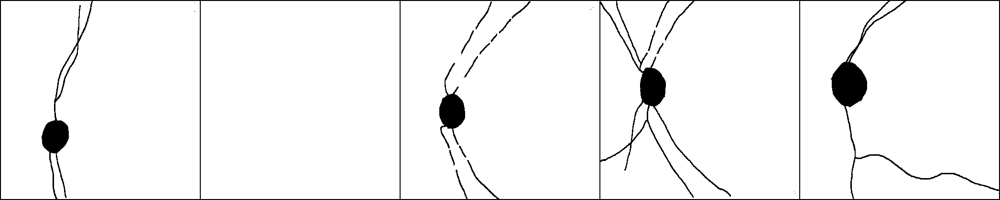

In [16]:
TF.to_pil_image(torchvision.utils.make_grid(mask_y[:5].expand(5, 3, 416, 416)))

In [17]:
from sklearn.metrics import jaccard_score, precision_score, recall_score
def calc_metric(labels, preds):
    accuracy = np.mean(np.equal(labels,preds))
    right = np.sum(labels *preds == 1)
    precision = right / np.sum(preds)
    recall = right / np.sum(labels)
    f1 = 2 * precision*recall/(precision+recall)

    
    y_pred = preds
    y_true = labels
    """ Ground truth """
    #y_true = y_true.cpu().numpy()
    y_true = y_true > 0.5
    y_true = y_true.astype(np.uint8)
    y_true = y_true.reshape(-1)

    """ Prediction """
    #y_pred = y_pred.cpu().numpy()
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(np.uint8)
    y_pred = y_pred.reshape(-1)

    score_jaccard = jaccard_score(y_true, y_pred)

    print('jaccard, f1, recall, precision, acc')
    print(score_jaccard, f1, recall, precision, accuracy)
    return score_jaccard, f1, recall, precision, accuracy

# Train

PFNet_aug+focal+coslr+2lb_b32_e300_js_221003_16:05
../model/vessel_PFNet_aug+focal+coslr+2lb_b32_e300_221003_16:05.pt
Training 300 epochs.


100%|██████████| 42/42 [02:32<00:00,  3.63s/it, Epoch=0, Loss=12.103793, Mean Loss=12.883252, lr=0.000010]


Testing...
jaccard, f1, recall, precision, acc
0.0892399253146313 0.1638572425425078 0.16736531600033525 0.1604932123371088 0.8447437677098092
Model Saved


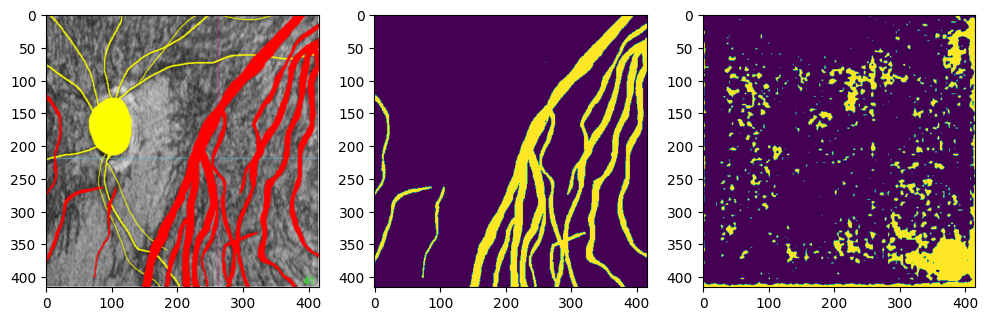

100%|██████████| 42/42 [02:02<00:00,  2.91s/it, Epoch=10, Loss=9.112654, Mean Loss=9.616304, lr=0.000970] 


Testing...
jaccard, f1, recall, precision, acc
0.05345781146095736 0.10149018001360861 0.074269337197633 0.1602093435877903 0.8804699382500625


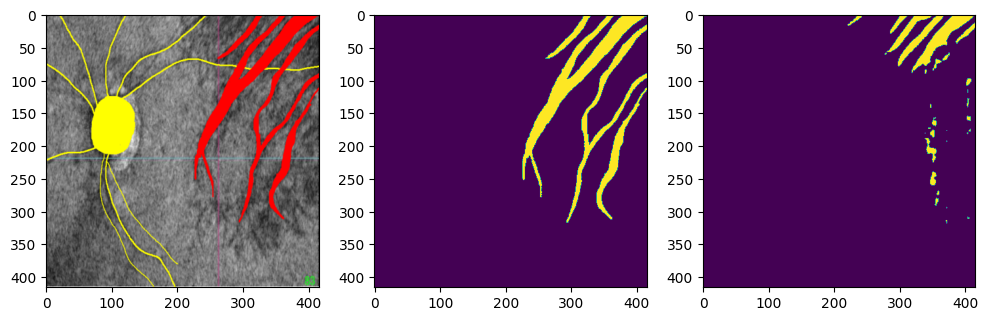

100%|██████████| 42/42 [02:05<00:00,  2.98s/it, Epoch=20, Loss=9.196125, Mean Loss=9.190988, lr=0.000753]


Testing...
jaccard, f1, recall, precision, acc
0.3470821838426304 0.515309589876036 0.4554220656190747 0.5933321450169102 0.9221284065338778
Model Saved


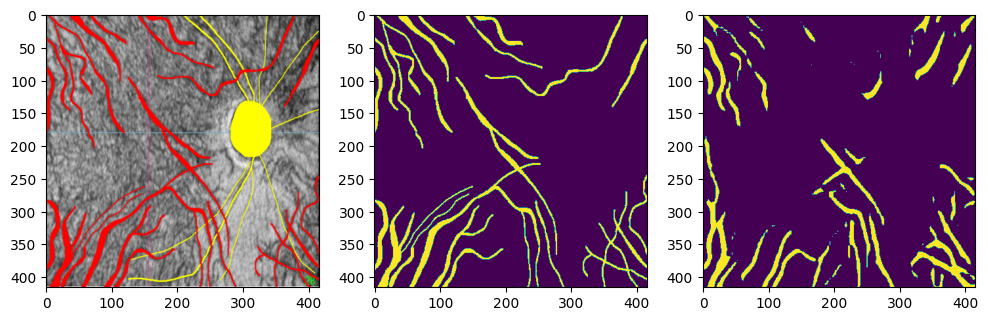

100%|██████████| 42/42 [02:01<00:00,  2.89s/it, Epoch=30, Loss=8.805241, Mean Loss=8.830086, lr=0.000419]


Testing...
jaccard, f1, recall, precision, acc
0.38283460763427024 0.5536954390940753 0.5325162049158075 0.5766291326056115 0.9219699297858155
Model Saved


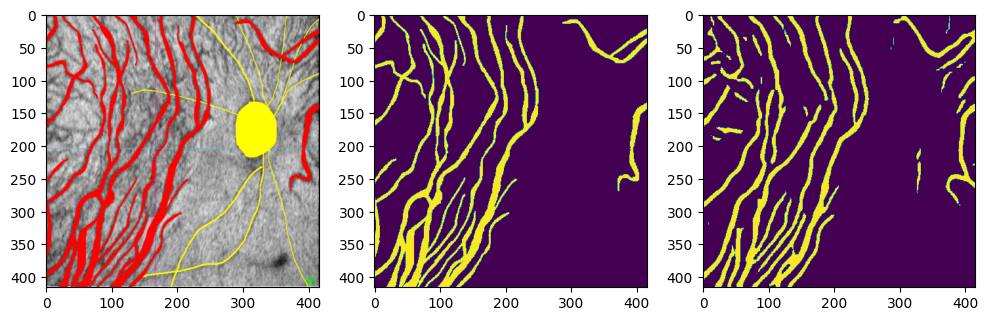

100%|██████████| 42/42 [02:03<00:00,  2.95s/it, Epoch=40, Loss=8.870442, Mean Loss=8.395827, lr=0.000126]


Testing...
jaccard, f1, recall, precision, acc
0.3785375533331262 0.5491871475214748 0.4866005456914515 0.6302499470583829 0.9273865107248521


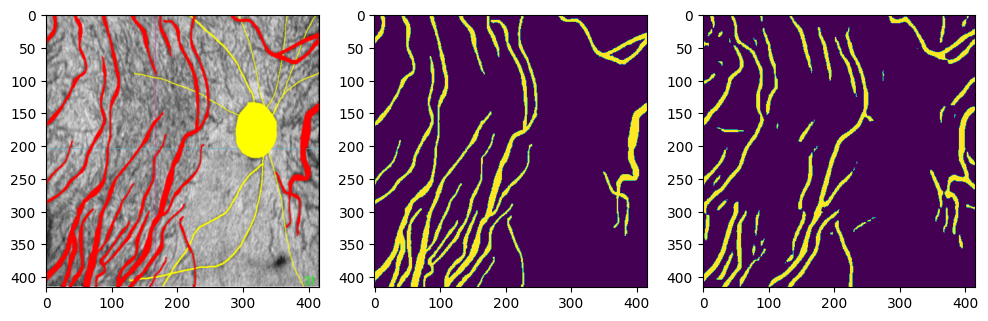

100%|██████████| 42/42 [01:57<00:00,  2.80s/it, Epoch=50, Loss=8.124983, Mean Loss=8.128109, lr=0.000010]


Testing...
jaccard, f1, recall, precision, acc
0.3541853208823376 0.5230972680335413 0.4536384324945005 0.617672116357607 0.9248159026273023


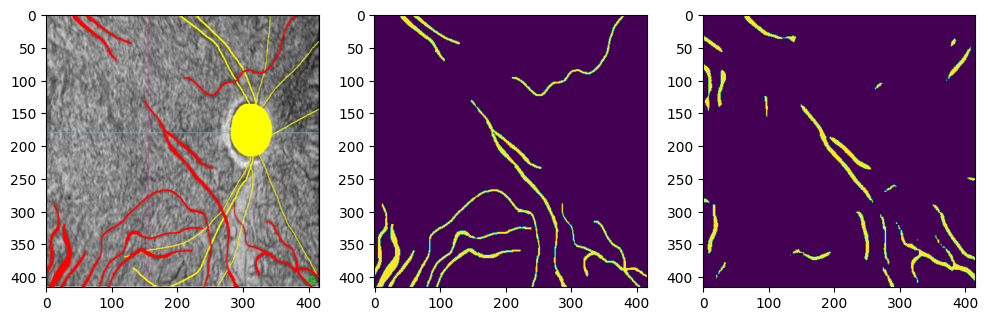

100%|██████████| 42/42 [01:56<00:00,  2.78s/it, Epoch=60, Loss=8.116840, Mean Loss=8.737297, lr=0.000776]


Testing...
jaccard, f1, recall, precision, acc
0.01835348518564288 0.036045411446295764 0.019123018394343376 0.3132278143131193 0.9070323568630719


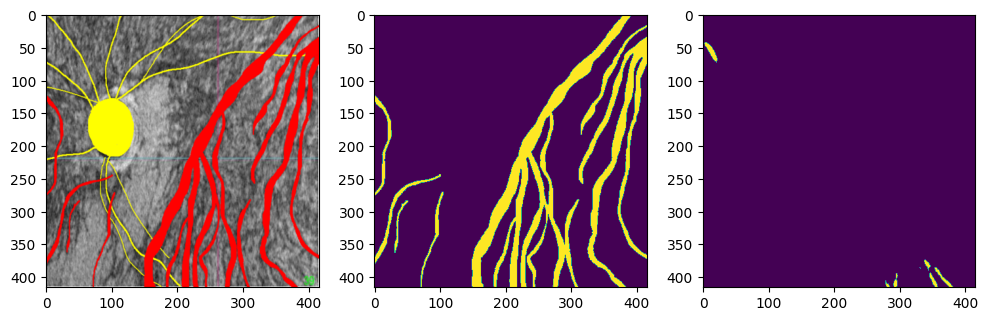

100%|██████████| 42/42 [01:55<00:00,  2.74s/it, Epoch=70, Loss=9.187367, Mean Loss=8.614760, lr=0.000603]


Testing...
jaccard, f1, recall, precision, acc
0.3221299885521489 0.48728943650224615 0.3771769815340248 0.6882020654586899 0.9278561624927077


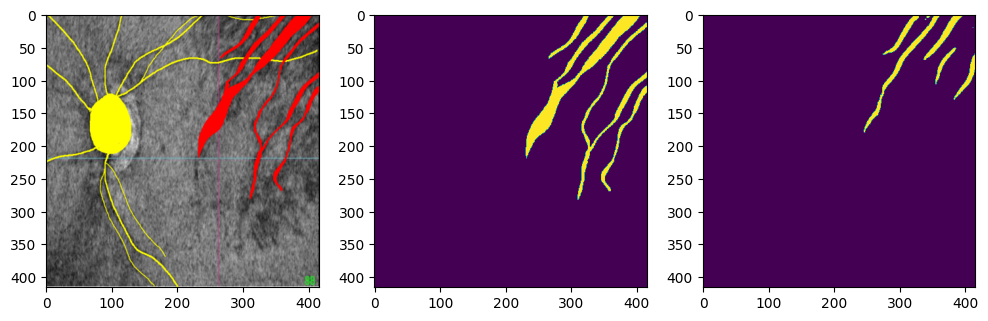

100%|██████████| 42/42 [02:01<00:00,  2.89s/it, Epoch=80, Loss=7.994328, Mean Loss=8.290325, lr=0.000336]


Testing...
jaccard, f1, recall, precision, acc
0.353314875075837 0.5221473310947505 0.4301908200915885 0.6641046828681133 0.9284300221633053


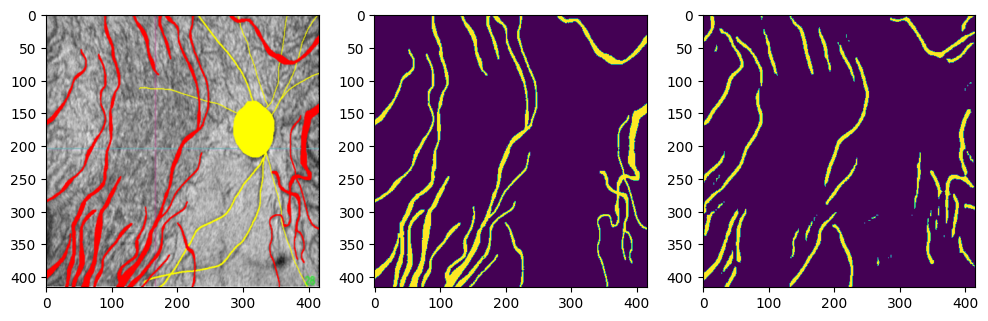

100%|██████████| 42/42 [02:00<00:00,  2.86s/it, Epoch=90, Loss=7.959677, Mean Loss=7.995093, lr=0.000102]


Testing...
jaccard, f1, recall, precision, acc
0.368060568845307 0.538076423262405 0.4876438636215489 0.6001438287948069 0.923897710876948


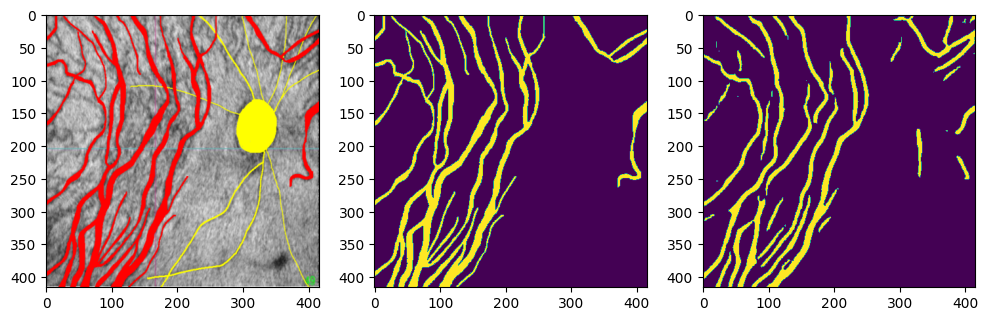

100%|██████████| 42/42 [01:50<00:00,  2.64s/it, Epoch=100, Loss=8.271719, Mean Loss=7.860755, lr=0.000010]


Testing...
jaccard, f1, recall, precision, acc
0.35294128409945297 0.5217392480330414 0.4490702901877972 0.622467497812502 0.9251667944984999


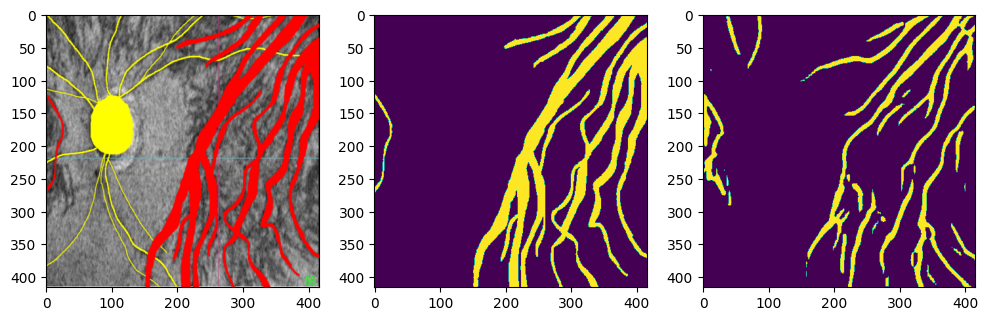

100%|██████████| 42/42 [01:56<00:00,  2.77s/it, Epoch=110, Loss=9.394769, Mean Loss=8.375317, lr=0.000621]


Testing...
jaccard, f1, recall, precision, acc
0.3327523772132631 0.49934613946671214 0.525607312752547 0.4755842907112534 0.9041998779846238


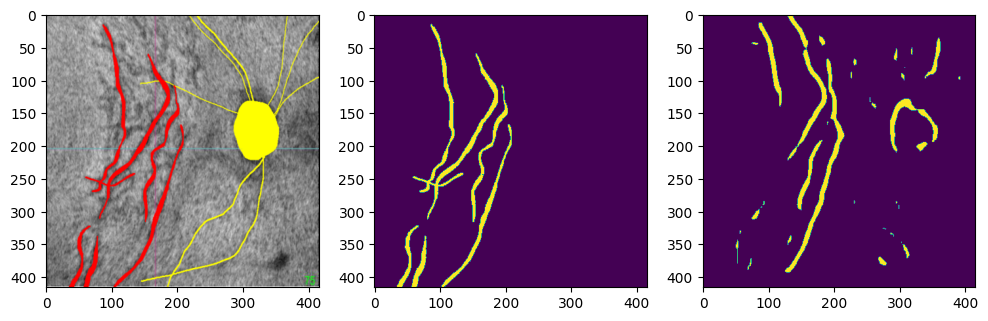

100%|██████████| 42/42 [01:58<00:00,  2.82s/it, Epoch=120, Loss=7.939371, Mean Loss=8.253997, lr=0.000483]


Testing...
jaccard, f1, recall, precision, acc
0.34184689411694585 0.5095169882878648 0.42521276450956896 0.6355168652851474 0.92558844421931


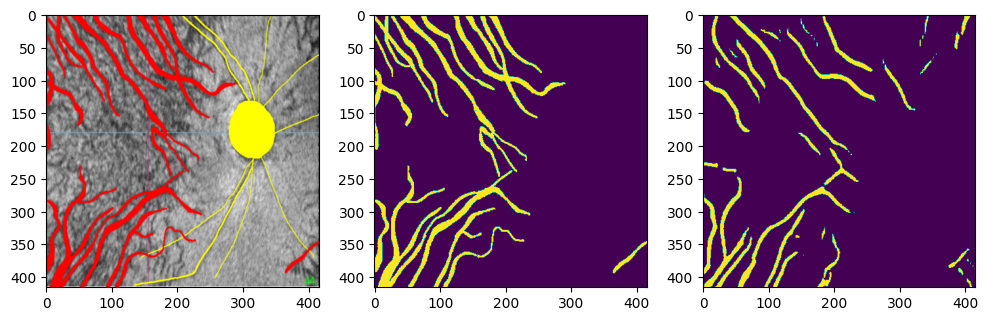

100%|██████████| 42/42 [02:00<00:00,  2.88s/it, Epoch=130, Loss=8.525785, Mean Loss=8.029823, lr=0.000270]


Testing...
jaccard, f1, recall, precision, acc
0.3669417087439994 0.5368798192296876 0.4754177390551902 0.6165930681868065 0.9254477423899908


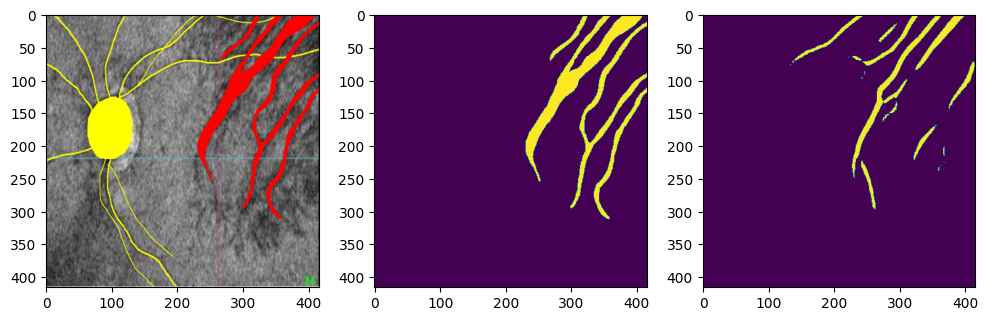

100%|██████████| 42/42 [01:56<00:00,  2.77s/it, Epoch=140, Loss=7.607979, Mean Loss=7.720703, lr=0.000084]


Testing...
jaccard, f1, recall, precision, acc
0.3264912340557426 0.4922629349875109 0.4044357666434818 0.62881658480274 0.9241666786034253


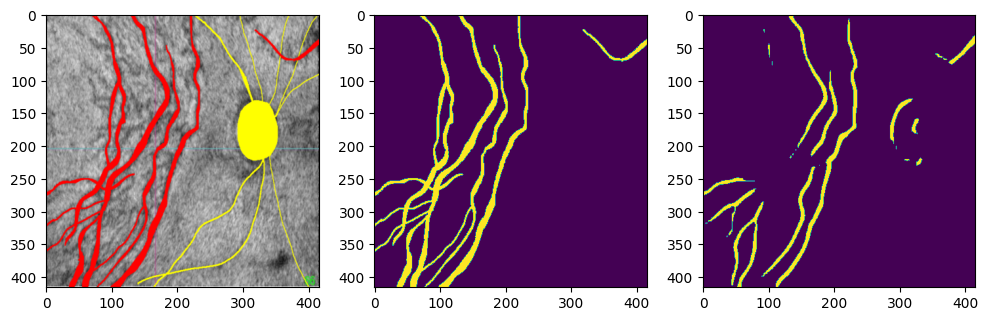

100%|██████████| 42/42 [01:57<00:00,  2.80s/it, Epoch=150, Loss=7.568440, Mean Loss=7.672206, lr=0.000010]


Testing...
jaccard, f1, recall, precision, acc
0.3423393561676778 0.5100637995820106 0.4379721882169901 0.6105646830320476 0.9235230865592966


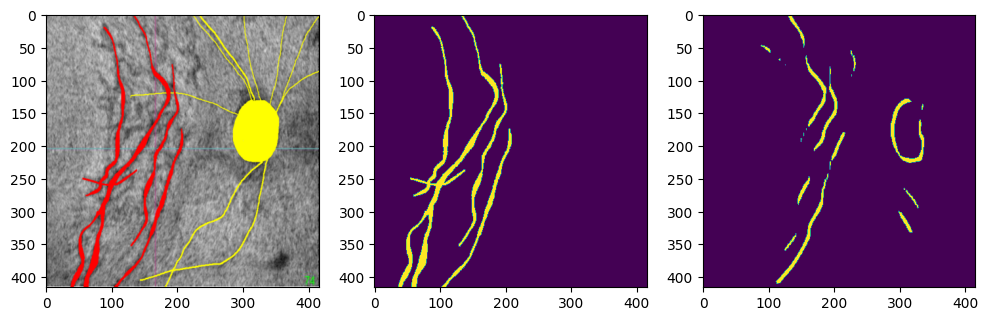

100%|██████████| 42/42 [01:56<00:00,  2.77s/it, Epoch=160, Loss=7.639313, Mean Loss=8.140997, lr=0.000497]


Testing...
jaccard, f1, recall, precision, acc
0.04326460368888196 0.08294080626506935 0.06406376810763689 0.11758984518422318 0.8712312777366864


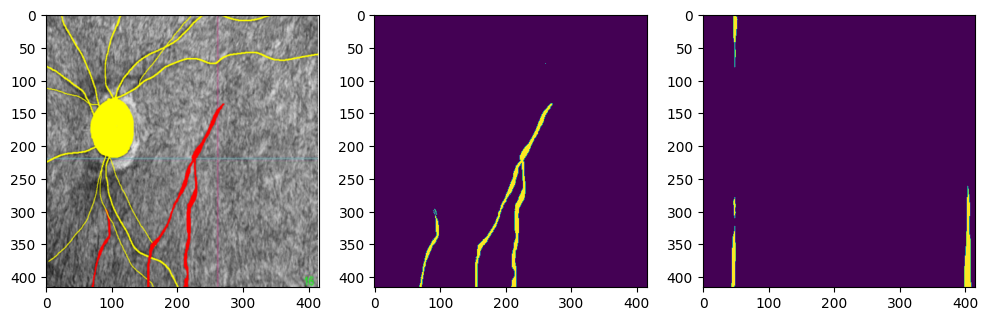

100%|██████████| 42/42 [01:54<00:00,  2.73s/it, Epoch=170, Loss=8.026299, Mean Loss=7.918547, lr=0.000387]


Testing...
jaccard, f1, recall, precision, acc
0.37406527217225627 0.5444650698156389 0.5362349725327662 0.5529517348101395 0.9184403062234353


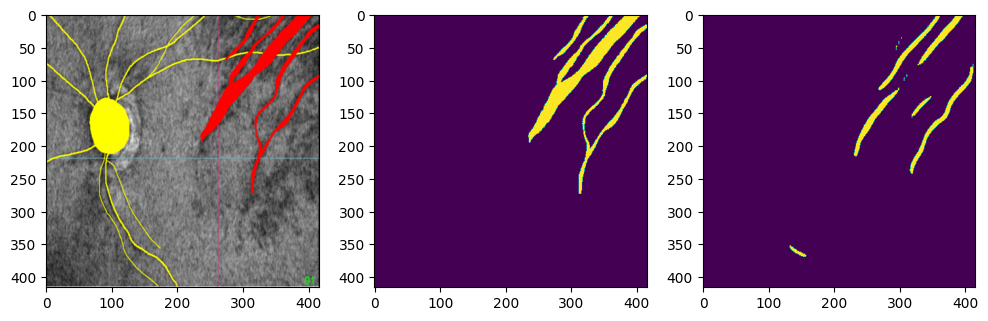

100%|██████████| 42/42 [01:58<00:00,  2.82s/it, Epoch=180, Loss=7.054674, Mean Loss=7.701853, lr=0.000217]


Testing...
jaccard, f1, recall, precision, acc
0.3493314162596241 0.5177844553978864 0.4380533112898246 0.6329979442951603 0.9258368861467622


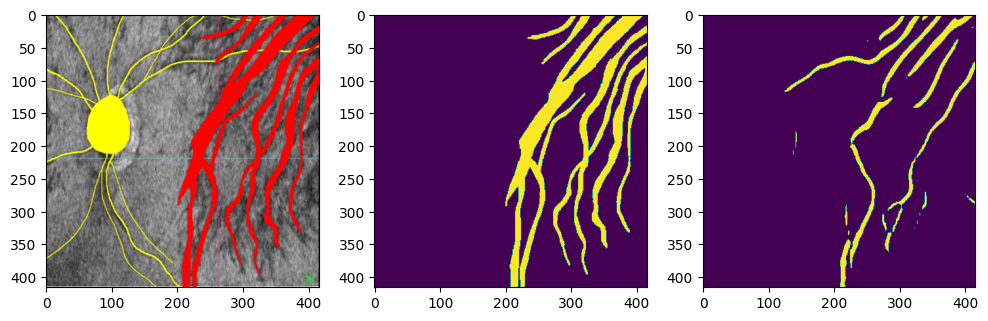

100%|██████████| 42/42 [01:57<00:00,  2.81s/it, Epoch=190, Loss=6.686469, Mean Loss=7.580917, lr=0.000069]


Testing...
jaccard, f1, recall, precision, acc
0.3485676088230791 0.5169449518771708 0.4627048760518242 0.5855901163363885 0.9213995209236187


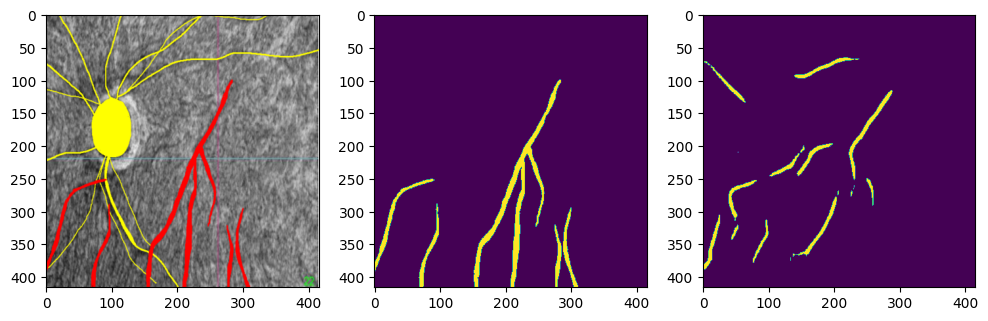

100%|██████████| 42/42 [01:57<00:00,  2.79s/it, Epoch=200, Loss=7.652734, Mean Loss=7.541595, lr=0.000010]


Testing...
jaccard, f1, recall, precision, acc
0.34673442706348995 0.5149262097940616 0.4486754196014833 0.6041314169546322 0.9231641536534294


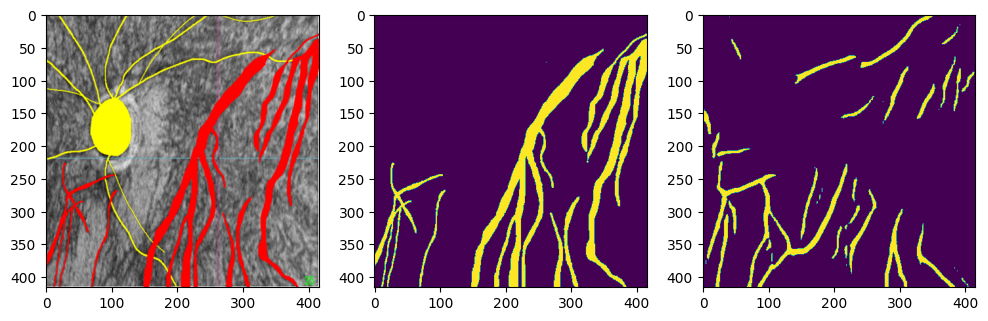

100%|██████████| 42/42 [01:57<00:00,  2.80s/it, Epoch=210, Loss=7.967010, Mean Loss=7.886560, lr=0.000398]


Testing...
jaccard, f1, recall, precision, acc
0.0699624319331475 0.1307754923819958 0.094826604356506 0.2106229087744364 0.8854211158221519


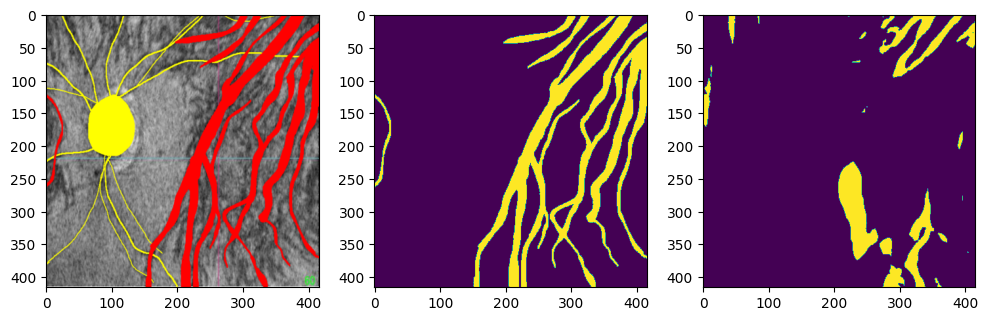

100%|██████████| 42/42 [01:56<00:00,  2.77s/it, Epoch=220, Loss=7.271891, Mean Loss=7.762113, lr=0.000310]


Testing...
jaccard, f1, recall, precision, acc
0.10660384585417339 0.1926684897283856 0.1457858623078207 0.28399821246107204 0.8889482489426203


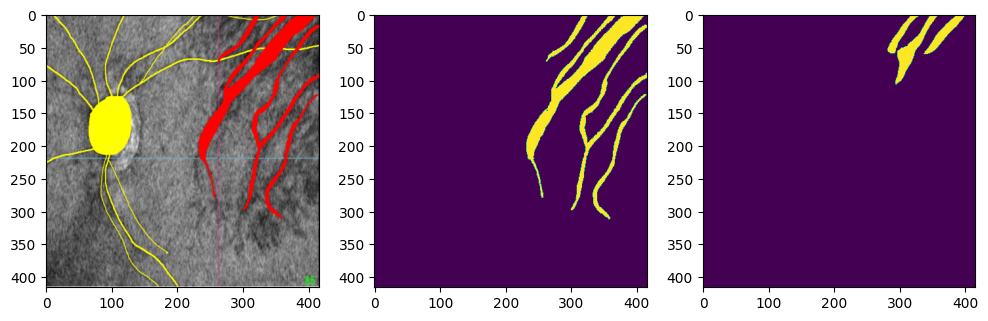

100%|██████████| 42/42 [02:00<00:00,  2.87s/it, Epoch=230, Loss=7.789515, Mean Loss=7.575505, lr=0.000175]


Testing...
jaccard, f1, recall, precision, acc
0.2067775423427523 0.3426937195754058 0.26038876755249 0.5010763893555483 0.909206935864447


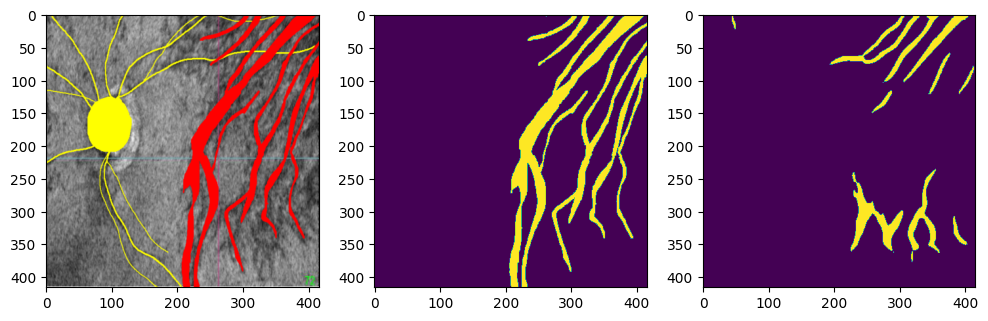

100%|██████████| 42/42 [01:56<00:00,  2.78s/it, Epoch=240, Loss=7.409003, Mean Loss=7.449202, lr=0.000057]


Testing...
jaccard, f1, recall, precision, acc
0.33538857624042623 0.5023085897359694 0.4411472700742894 0.5831585690372825 0.9205412137209351


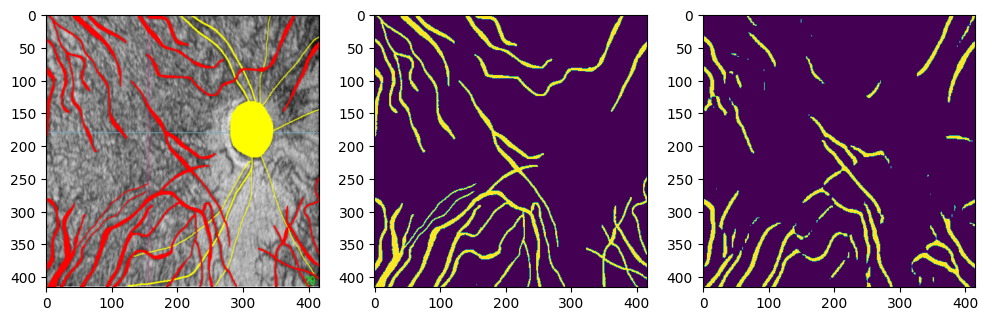

100%|██████████| 42/42 [01:55<00:00,  2.76s/it, Epoch=250, Loss=7.572303, Mean Loss=7.339177, lr=0.000010]


Testing...
jaccard, f1, recall, precision, acc
0.32564832640405694 0.4913042470130943 0.41739289426350634 0.5970245175938762 0.9214363892303525


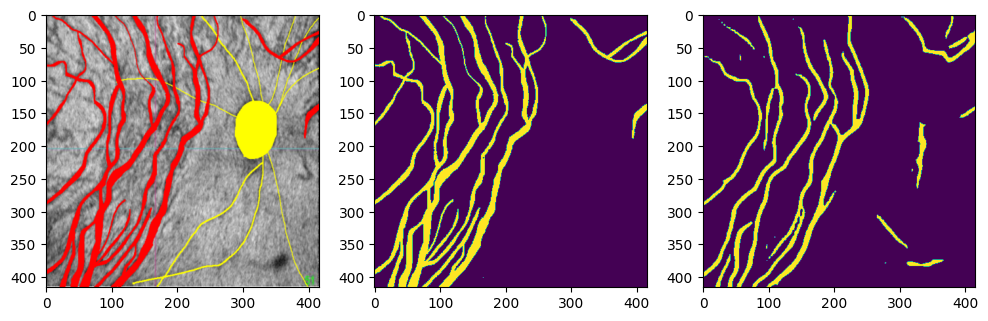

100%|██████████| 42/42 [01:57<00:00,  2.80s/it, Epoch=260, Loss=7.605291, Mean Loss=7.654503, lr=0.000318]


Testing...
jaccard, f1, recall, precision, acc
0.06406737333953369 0.12041976841834881 0.0833669406107475 0.2167595809243374 0.8893018591393033


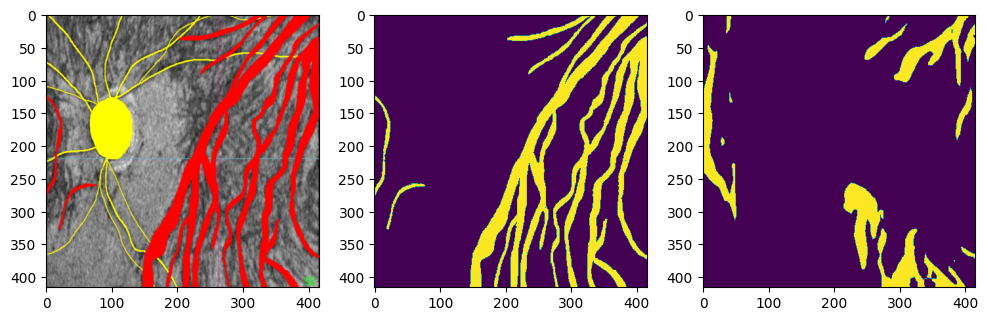

100%|██████████| 42/42 [01:57<00:00,  2.81s/it, Epoch=270, Loss=8.599246, Mean Loss=7.689785, lr=0.000248]


Testing...
jaccard, f1, recall, precision, acc
0.11435149409134178 0.20523415582546625 0.14723264664651903 0.33863927774571917 0.8963516328183598


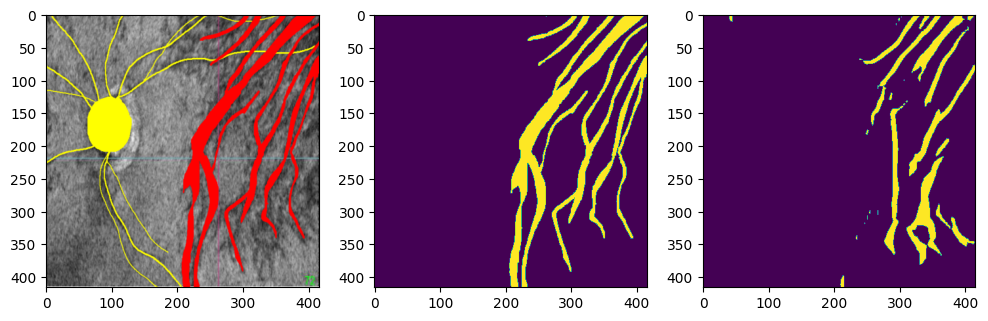

100%|██████████| 42/42 [01:58<00:00,  2.83s/it, Epoch=280, Loss=6.734500, Mean Loss=7.427670, lr=0.000141]


Testing...
jaccard, f1, recall, precision, acc
0.3268433166178712 0.49266301834491827 0.4430816882481499 0.5547389154388478 0.9170532928525293


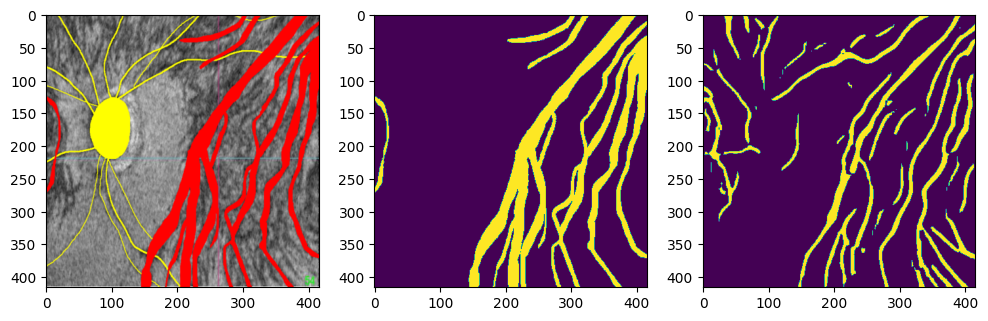

100%|██████████| 42/42 [01:55<00:00,  2.74s/it, Epoch=290, Loss=7.070230, Mean Loss=7.256311, lr=0.000047]


Testing...
jaccard, f1, recall, precision, acc
0.29012850584895405 0.44976683258081857 0.3715925623215024 0.5695964235607761 0.9173590800535462


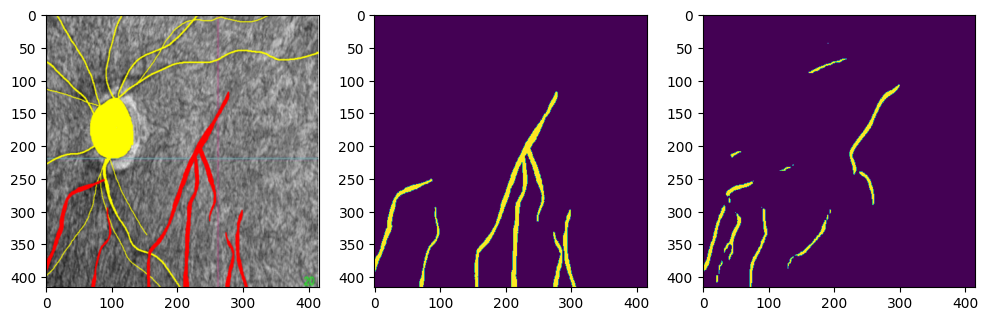

100%|██████████| 42/42 [01:58<00:00,  2.82s/it, Epoch=299, Loss=7.873181, Mean Loss=7.272268, lr=0.000010]


Testing...
jaccard, f1, recall, precision, acc
0.3211667689223906 0.4861865685349477 0.415936797783997 0.5849883525501354 0.9200904600122927


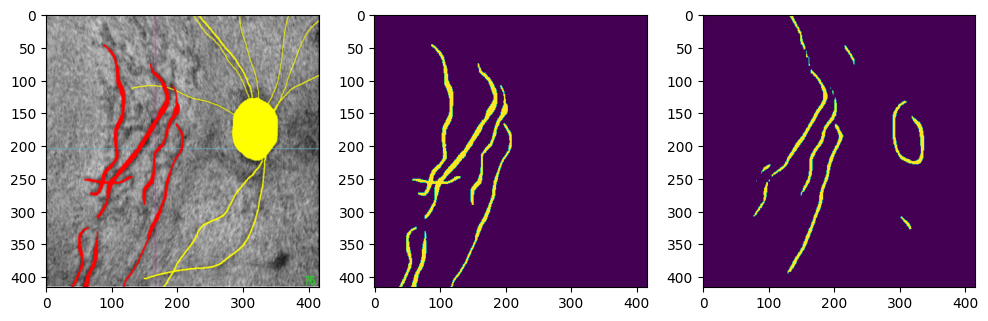

In [18]:
from typing import DefaultDict
from sklearn.exceptions import DataDimensionalityWarning
from tensorboardX import SummaryWriter
import datetime 

exp = 'PFNet_aug+focal+coslr+2lb'

num_epochs = args['epoch_num']
resume_epochs = args['last_epoch']
load_from = '../model/vessel_PFNet_base_b32_e500_220921_00:30.pt'


batch_size = args['train_batch_size']
scaler = torch.cuda.amp.GradScaler()
now = datetime.datetime.now()
log_name = f'{exp}_b{batch_size}_e{num_epochs}_js_'+now.strftime("%y%m%d_%H:%M")
writer = SummaryWriter(log_dir='./ckpt/PFNet/log/'+ log_name)
save_path = f'../model/vessel_{exp}_b{batch_size}_e{num_epochs}_'+ now.strftime("%y%m%d_%H:%M") + '.pt'

if torch.cuda.device_count() > 1:
    print(f'Using {torch.cuda.device_count()} GPUs.')
    net = nn.DataParallel(net)

# net.float()
net = net.to(device)
train_loss_list = []
test_acc_list = []
test_miou_list = []
test_f1_list = []
print(log_name)
print(save_path)
print(f'Training {num_epochs} epochs.')
if resume_epochs != 0:
    print(f'Resuming from epoch {resume_epochs}')
    net.load_state_dict(torch.load(load_from))
if args['amp'] == True:
    print("Using mixed precision.")

# print(data.shape, aug_masks[0].shape, aug_masks[1].shape, aft_mask.shape)
curr_iter = 1

for epoch in range(args['last_epoch'], args['last_epoch'] + args['epoch_num']):
    
    net.train()

    loss_running = 0
    tqdm_dataset = tqdm(train_loader)
    for batch_idx, batch in enumerate(tqdm_dataset):
        if args['poly_train']:
            base_lr = args['lr'] * (1 - float(curr_iter) / float(num_epochs)) ** args['lr_decay']
            optimizer.param_groups[0]['lr'] = 2 * base_lr
            optimizer.param_groups[1]['lr'] = 1 * base_lr
        # label: ([32, 2, 416, 416])
        image, [mask_r, mask_y], _ = batch
        image = image.float().to(device)
        mask_r = mask_r.float().to(device)
        mask_y = mask_y.float().to(device)

        optimizer.zero_grad()

        predict_1, predict_2, predict_3, predict_4 = net(image)

        loss_1_r = focal_iou_loss(predict_1, mask_r)    #Fine
        loss_2_r = structure_loss(predict_2, mask_r)
        loss_3_r = structure_loss(predict_3, mask_r)
        loss_4_r = structure_loss(predict_4, mask_r)    #Coarse
        loss_r = 1 * loss_1_r + 1 * loss_2_r + 2 * loss_3_r + 4 * loss_4_r 

        loss_1_y = focal_iou_loss(predict_1, mask_y)
        loss_2_y = structure_loss(predict_2, mask_y)
        # loss_3_y = structure_loss(predict_3, mask_y)
        # loss_4_y = structure_loss(predict_4, mask_y)

        loss_y = 1 * loss_1_y + 1 * loss_2_y #+ 2 * loss_3_y + 4 * loss_4_y
        
        loss = loss_r + loss_y
        # loss = loss_r
        # loss = loss_r + 0.2*loss_y
        # loss = loss_r + 0.5*loss_y

        
        loss.backward()
        # nn.utils.clip_grad_norm_(net.parameters(), max_norm=10)
        optimizer.step()
        
        loss_running += loss.item()
        
        tqdm_dataset.set_postfix({
            'Epoch': epoch,
            'Loss': '{:06f}'.format(loss.item()),
            'Mean Loss' : '{:06f}'.format(loss_running/(batch_idx+1)),
            'lr' : '{:06f}'.format(optimizer.param_groups[0]["lr"])
        })

        curr_iter += 1

    epoch_loss = loss_running / len(train_loader)

    writer.add_scalar('loss/Train', epoch_loss, epoch)
    writer.add_scalar('learning_rate', optimizer.param_groups[0]["lr"], epoch)
    train_loss_list.append(epoch_loss)
    scheduler.step()

## EVAL
    if epoch % 10 == 0 or epoch == args['epoch_num']-1 :
        print("Testing...")

        images=[]
        preds=[]
        labels=[]
        mask_os = []
        net.eval()
        # tqdm_loader = tqdm(test_loader)
        with torch.no_grad():
            for idx, batch in enumerate(test_loader):

                image, [mask_r, mask_y], mask_o = batch
                
                image = image.float().to(device)
            
                label = mask_r.float()

                mask_o = mask_o

                _, _, _, pred = net(image)    

                images.append(image.cpu().detach().numpy())
                labels.append(label.numpy())
                mask_os.append(mask_o)
                preds.append(pred.cpu().detach().numpy())

            images= np.array(images)#.squeeze(1)
            preds = np.array(preds).squeeze(1)
            labels = np.array(labels).squeeze(1)
            mask_os = np.array(mask_os)
            preds = np.where(preds > 0.5 , 1 , 0)
            labels = np.where(labels > 0.5 , 1 , 0)
            
            score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)
            test_acc_list.append(score_acc)
            test_f1_list.append(score_f1)
            test_miou_list.append(score_jaccard)
            writer.add_scalar('Accuracy/Test', score_acc, epoch)
            writer.add_scalar('F1/Test', score_f1, epoch)
            writer.add_scalar('Recall/Test', score_recall, epoch)
            writer.add_scalar('Precision/Test', score_precision, epoch)
            writer.add_scalar('Jaccard/Test', score_jaccard, epoch)

            if np.max(test_f1_list) == test_f1_list[-1] or np.max(test_miou_list) == test_miou_list[-1]:
                torch.save(net.state_dict(), save_path)
                print("Model Saved")

            randnum = np.random.randint(0, 171)
            plt.figure(figsize=(10, 4))
            plt.subplot(1, 3, 1)  
            plt.imshow(mask_os[randnum][0].permute(1, 2, 0))
            plt.subplot(1, 3, 2)  
            plt.imshow(labels[randnum][0])
            plt.subplot(1, 3, 3)
            plt.imshow(preds[randnum][0])
            plt.tight_layout()
            plt.show()

# evaluation

In [19]:
print("Testing...")
net = PFNet(backbone_path)
load_from = '/home/sklab2/workspace/code_only/junsu/model/vessel_PFNet_aug+focal+coslr+2lb_b32_e300_221003_13:08.pt'
if torch.cuda.device_count() > 1:
    print(f'Using {torch.cuda.device_count()} GPUs.')
    net = nn.DataParallel(net)
net.load_state_dict(torch.load(load_from))
net.to(device)

images=[]
preds=[]
labels=[]
mask_os = []
net.eval()
# tqdm_loader = tqdm(test_loader)
with torch.no_grad():
    for idx, batch in enumerate(tqdm(test_loader)):

        image, [mask_r, mask_y], mask_o = batch
        
        image = image.float().to(device)
    
        label = mask_r.float()

        _, _, _, pred = net(image)    

        images.append(image.cpu().detach().numpy())
        labels.append(label.numpy())
        mask_os.append(mask_o)
        preds.append(pred.cpu().detach().numpy())

    images= np.array(images)#.squeeze(1)
    preds = np.array(preds).squeeze(1)
    labels = np.array(labels).squeeze(1)
    mask_os = np.array(mask_os)
    preds = np.where(preds > 0.5 , 1 , 0)
    labels = np.where(labels > 0.5 , 1 , 0)
    
    score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)
    # infer 20sec
    # calc 25sec 

Testing...
From ./backbone/resnet/resnet50-19c8e357.pth Load resnet50 Weights Succeed!


100%|██████████| 355/355 [00:23<00:00, 15.39it/s]


jaccard, f1, recall, precision, acc
0.3988860689611183 0.5702910019789542 0.5196289183518656 0.6318990482088966 0.9288229422764397


In [20]:
images[0].shape

(1, 3, 416, 416)

In [21]:
preds[0].shape

(1, 416, 416)

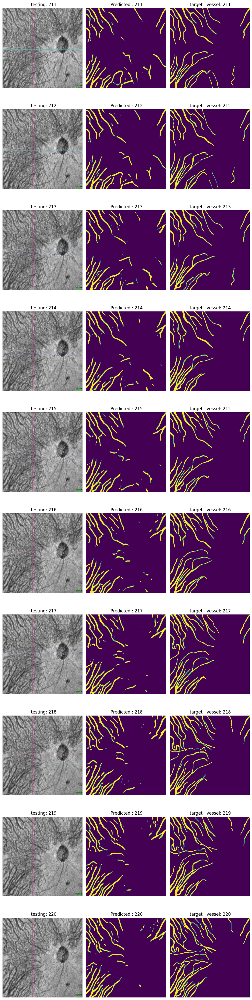

In [22]:
# randnum = np.random.randint(0, len(test_dataset)-10)
randnum=211

fig, axes = plt.subplots(10, 3, figsize = (10,40))
[c_ax.axis('off') for c_ax in axes.flatten()]

for idx, (img_ax, target_ax , mask_ax ) in zip(range(randnum, randnum+10), axes):
    
# inputs[:10] , preds[:10], targets[:10], urls_list[:10]) :
    
    image = images[idx][0].astype(int).transpose(1, 2, 0) 
    img_target = preds[idx].transpose(1, 2, 0) 
    img_mask = labels[idx].transpose(1, 2, 0)  
 
    img_ax.imshow(np.clip(image, 0, 255))

    target_ax.imshow(img_target )
    mask_ax.imshow(img_mask)

    img_ax.set_title(f'  testing: {idx}')
    target_ax.set_title(f' Predicted : {idx}')
    
    mask_ax.set_title(f' target   vessel: {idx}')
plt.tight_layout()
plt.show()

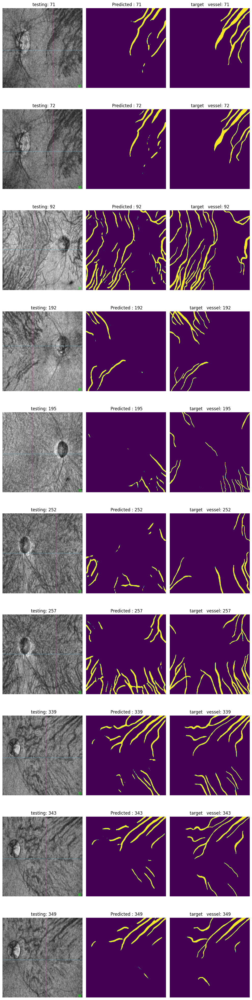

In [23]:
# randnum = np.random.randint(0, len(test_dataset)-10)

randidx = sorted([np.random.randint(0, len(test_dataset)) for i in range(10)])

fig, axes = plt.subplots(10, 3, figsize = (10,40))
[c_ax.axis('off') for c_ax in axes.flatten()]

for idx, (img_ax, target_ax , mask_ax ) in zip(randidx, axes):
    
# inputs[:10] , preds[:10], targets[:10], urls_list[:10]) :
    
    image = images[idx][0].astype(int).transpose(1, 2, 0) # astype(int)
    img_target = preds[idx].transpose(1, 2, 0) 
    img_mask = labels[idx].transpose(1, 2, 0)  
 
    img_ax.imshow(np.clip(image, 0, 255))

    target_ax.imshow(img_target )
    mask_ax.imshow(img_mask)

    img_ax.set_title(f'  testing: {idx}')
    target_ax.set_title(f' Predicted : {idx}')
    
    mask_ax.set_title(f' target   vessel: {idx}')
plt.tight_layout()
plt.show()